In [1]:
import cv2

path = "butterfly.jpg"

img_bgr = cv2.imread(path)

cv2.imshow("OpenCV window (BGR)", img_bgr)
cv2.waitKey(0)        
cv2.destroyAllWindows()

In [2]:
img_bgr[1:]

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [209, 209, 209]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [209, 209, 209]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [209, 209, 209]],

       ...,

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [209, 209, 209]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [209, 209, 209]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [209, 209, 209]]

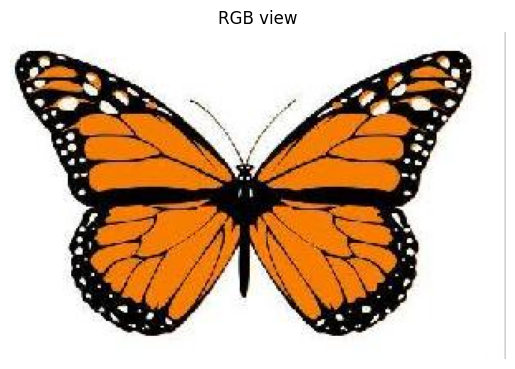

In [3]:
import matplotlib.pyplot as plt
# Convert to RGB for correct visualization with matplotlib
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

plt.imshow(img_rgb)
plt.title("RGB view")
plt.axis("off")
plt.show()

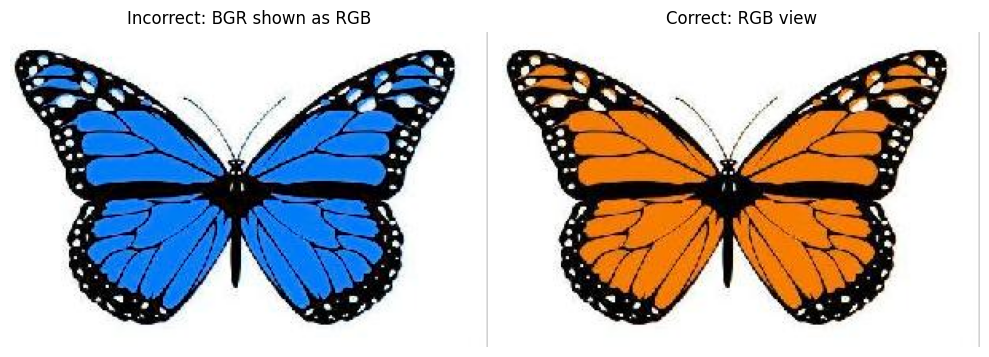

In [4]:
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

axes[0].imshow(img_bgr)
axes[0].set_title("Incorrect: BGR shown as RGB")
axes[0].axis("off")

# CORRECT for Matplotlib: convert to RGB first
axes[1].imshow(img_rgb)
axes[1].set_title("Correct: RGB view")
axes[1].axis("off")

plt.tight_layout()
plt.show()


In [5]:
# Image shape
print("Image shape:", img_bgr.shape)

Image shape: (198, 300, 3)


In [6]:
# Grayscale image

img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
print("Gray shape:", img_gray.shape)  # (H, W)

Gray shape: (198, 300)


In [7]:
import numpy as np
img_rgb = img_rgb.astype(np.float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


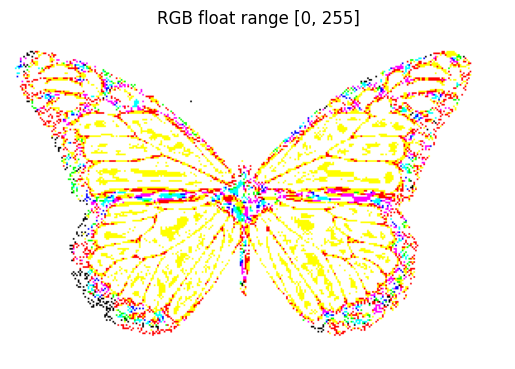

In [8]:
img_rgb = img_rgb.astype(np.float32)

plt.imshow(img_rgb)
plt.title("RGB float range [0, 255]")
plt.axis("off")
plt.show()

In [9]:
img_rgb = img_rgb.astype(np.float32) / 255.0 

In [10]:
img_rgb

array([[[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        ...,
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [0.81960785, 0.81960785, 0.81960785]],

       [[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        ...,
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [0.81960785, 0.81960785, 0.81960785]],

       [[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        ...,
        [1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [0.81960785, 0.81960785, 0.81960785]],

       ...,

       [[1.        , 1.        , 1.        ],
        [1.        , 1.        , 1.        ],
        [1.        , 1

In [11]:
h, w = img_rgb.shape[:2]

target_w, target_h = 224, 224
target_aspect = target_w / target_h 
current_aspect = w / h
print("Current aspect:", current_aspect, "| Target aspect:", target_aspect)


Current aspect: 1.5151515151515151 | Target aspect: 1.0


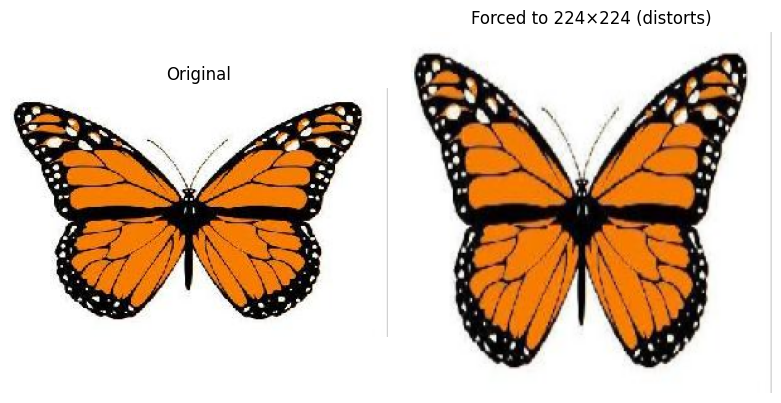

In [12]:
forced = cv2.resize(img_rgb, (target_w, target_h))  

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(img_rgb)
axes[0].set_title("Original")
axes[0].axis("off")
axes[1].imshow(forced)
axes[1].set_title("Forced to 224×224 (distorts)")
axes[1].axis("off")
plt.tight_layout()
plt.show()

In [15]:
# Shrinking (downsampling)
small_nearest = cv2.resize(img_rgb, (150, 100), interpolation=cv2.INTER_NEAREST)
small_linear  = cv2.resize(img_rgb, (150, 100), interpolation=cv2.INTER_LINEAR)
small_area    = cv2.resize(img_rgb, (150, 100), interpolation=cv2.INTER_AREA)

In [16]:
# Enlarging (upsampling)
large_nearest = cv2.resize(img_rgb, (1200, 800), interpolation=cv2.INTER_NEAREST)
large_linear  = cv2.resize(img_rgb, (1200, 800), interpolation=cv2.INTER_LINEAR)
large_area    = cv2.resize(img_rgb, (1200, 800), interpolation=cv2.INTER_AREA)

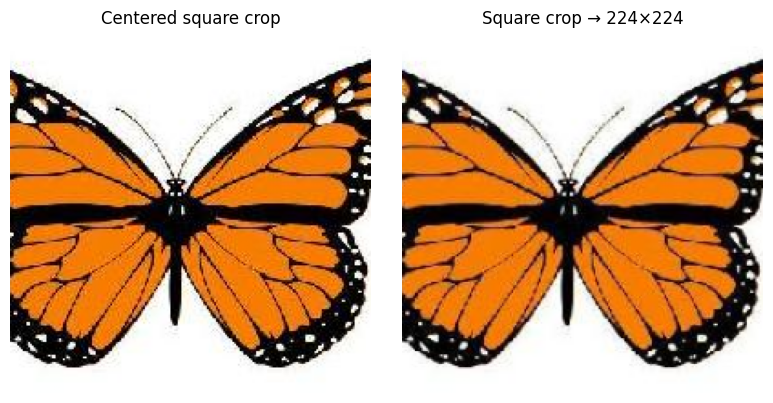

In [17]:
# Make a centered square crop
if h > w:
    # taller than wide → trim top and bottom equally
    margin = (h - w) // 2
    cropped = img_rgb[margin:h - margin, :, :]
else:
    # wider than tall → trim left and right equally
    margin = (w - h) // 2
    cropped = img_rgb[:, margin:w - margin, :]

crop_resized = cv2.resize(cropped, (target_w, target_h), interpolation=cv2.INTER_AREA)

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(cropped); axes[0].set_title("Centered square crop")
axes[0].axis("off")
axes[1].imshow(crop_resized)
axes[1].set_title("Square crop → 224×224")
axes[1].axis("off")
plt.tight_layout()
plt.show()

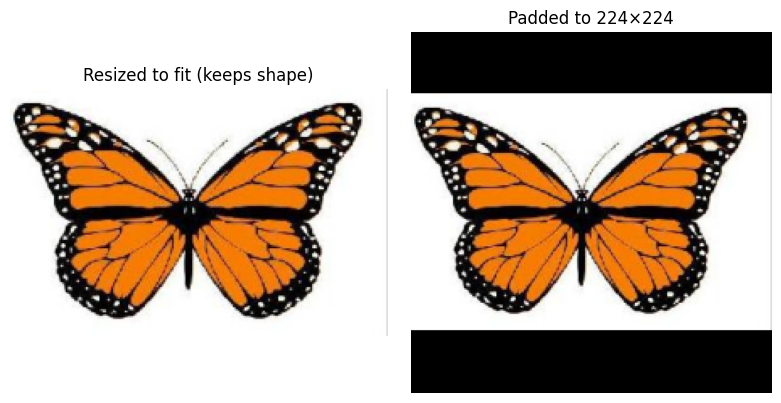

In [18]:
# Scale that fits inside the 224×224 box
scale = min(target_w / w, target_h / h)
new_w, new_h = int(w * scale), int(h * scale)

resized_fit = cv2.resize(img_rgb, (new_w, new_h), interpolation=cv2.INTER_AREA)

# Place it on a 224×224 canvas (black borders)
canvas = np.zeros((target_h, target_w, 3), dtype=img_rgb.dtype)
top  = (target_h - new_h) // 2
left = (target_w - new_w) // 2
canvas[top:top+new_h, left:left+new_w, :] = resized_fit

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(resized_fit)
axes[0].set_title("Resized to fit (keeps shape)")
axes[0].axis("off")
axes[1].imshow(canvas)
axes[1].set_title("Padded to 224×224")
axes[1].axis("off")
plt.tight_layout()
plt.show()


In [19]:
# A single orange pixel in RGB (float32 [0, 1])
rgb_pixel = np.array([[[1.0, 0.5, 0.0]]], dtype=np.float32)

hsv_pixel = cv2.cvtColor(rgb_pixel, cv2.COLOR_RGB2HSV)
lab_pixel = cv2.cvtColor(rgb_pixel, cv2.COLOR_RGB2Lab)

print("RGB:", rgb_pixel[0,0])  
print("HSV:", hsv_pixel[0,0])   # [H in degrees, S, V]
print("Lab:", lab_pixel[0,0])   # [L, a, b]


RGB: [1.  0.5 0. ]
HSV: [29.999996   0.9999999  1.       ]
Lab: [66.95557  43.078125 73.953125]


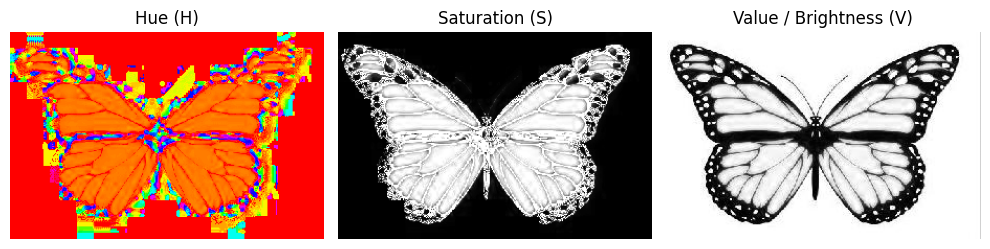

In [20]:
hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)

# Split the HSV image into its three single-channel arrays.
H = hsv[..., 0]   
S = hsv[..., 1]  
V = hsv[..., 2]   

# Display Hue: divide by 360 so values map to [0, 1] for the colormap.
plt.figure(figsize=(10, 3))
plt.subplot(1, 3, 1)
plt.imshow(H / 360.0, cmap="hsv", vmin=0, vmax=1)  # hsv colormap mirrors the hue wheel
plt.title("Hue (H)")
plt.axis("off")

# 4) Display Saturation and Value as true grayscale images.
plt.subplot(1, 3, 2)
plt.imshow(S, cmap="gray", vmin=0, vmax=1)
plt.title("Saturation (S)")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(V, cmap="gray", vmin=0, vmax=1)
plt.title("Value / Brightness (V)")
plt.axis("off")

plt.tight_layout()
plt.show()


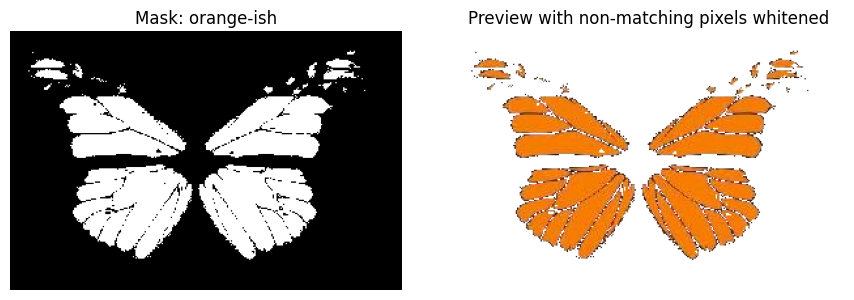

In [21]:
# Define the "orange" condition in HSV.
h_low, h_high = 10.0, 35.0      # degrees: a typical orange band
s_min = 0.35                    # avoid grayish pixels
v_min = 0.20                    # avoid very dark shadows (optional)

mask_orange = (H >= h_low) & (H <= h_high) & (S >= s_min) & (V >= v_min)

# Visualize the mask and also a preview where non-selected pixels are faded.
mask_vis = mask_orange.astype(np.float32)  # convert to 0.0/1.0 for display
preview  = img_rgb.copy()
preview[~mask_orange] = 1.0                # set non-matching pixels to white

plt.figure(figsize=(9, 3))
plt.subplot(1, 2, 1)
plt.imshow(mask_vis, cmap="gray", vmin=0, vmax=1)
plt.title("Mask: orange-ish")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(preview, vmin=0, vmax=1)
plt.title("Preview with non-matching pixels whitened")
plt.axis("off")
plt.tight_layout()
plt.show()


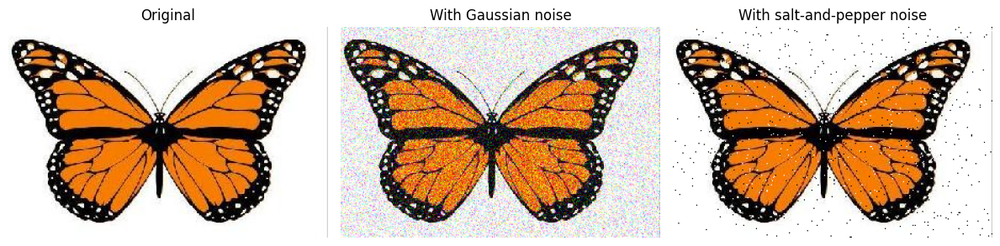

In [28]:
clean = img_rgb.copy()

# Add strong Gaussian noise (mean 0, std 0.05 in [0,1] scale)[
rng = np.random.default_rng(0)
gauss = clean + rng.normal(0.0, 0.20, size=clean.shape).astype(np.float32)
gauss = np.clip(gauss, 0.0, 1.0)

# Add salt-and-pepper noise: randomly set a small % of pixels to 0 or 1
sp = clean.copy()
p = 0.02
mask = rng.random(sp.shape[:2])
sp[mask < (p / 2)] = 0.0
sp[mask > 1 - (p / 2)] = 1.0

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(clean, vmin=0, vmax=1)
axes[0].set_title("Original")
axes[0].axis("off")

axes[1].imshow(gauss, vmin=0, vmax=1)
axes[1].set_title("With Gaussian noise")
axes[1].axis("off")

axes[2].imshow(sp, vmin=0, vmax=1)
axes[2].set_title("With salt-and-pepper noise")
axes[2].axis("off")

plt.tight_layout()
plt.show()

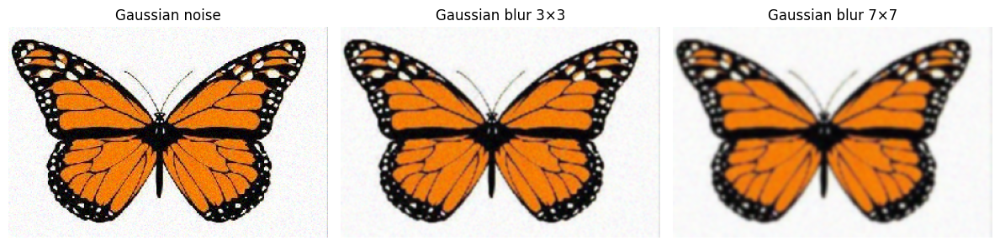

In [23]:
# Apply Gaussian blur to the Gaussian-noisy image
g3 = cv2.GaussianBlur(gauss, (3, 3), sigmaX=0)   # small smoothing
g7 = cv2.GaussianBlur(gauss, (7, 7), sigmaX=0)   # stronger smoothing

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(gauss, vmin=0, vmax=1)
axes[0].set_title("Gaussian noise")
axes[0].axis("off")
axes[1].imshow(g3,vmin=0, vmax=1)
axes[1].set_title("Gaussian blur 3×3")
axes[1].axis("off")
axes[2].imshow(g7, vmin=0, vmax=1)
axes[2].set_title("Gaussian blur 7×7")
axes[2].axis("off")
plt.tight_layout()
plt.show()


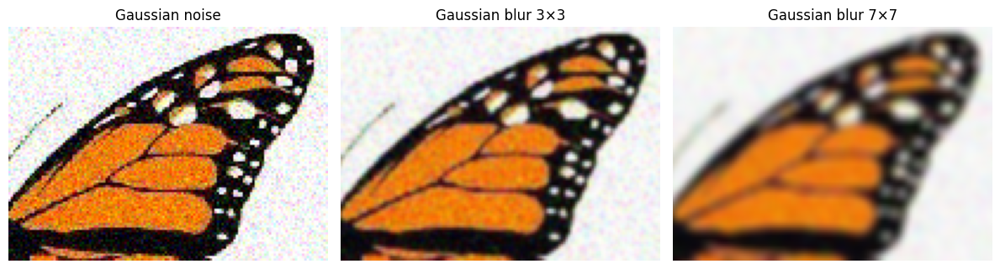

In [32]:
# Apply Gaussian blur to the Gaussian-noisy image
g3 = cv2.GaussianBlur(gauss, (3, 3), sigmaX=0.8)   # lighter smoothing
g7 = cv2.GaussianBlur(gauss, (7, 7), sigmaX=2.0)   # stronger smoothing

# Show a zoomed crop so the effect is easier to see
h, w = gauss.shape[:2]
y0, y1 = int(0.05 * h), int(0.55 * h)
x0, x1 = int(0.50 * w), int(0.95 * w)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(gauss[y0:y1, x0:x1], vmin=0, vmax=1)
axes[0].set_title("Gaussian noise")
axes[0].axis("off")

axes[1].imshow(g3[y0:y1, x0:x1], vmin=0, vmax=1)
axes[1].set_title("Gaussian blur 3×3")
axes[1].axis("off")

axes[2].imshow(g7[y0:y1, x0:x1], vmin=0, vmax=1)
axes[2].set_title("Gaussian blur 7×7")
axes[2].axis("off")

plt.tight_layout()
plt.show()

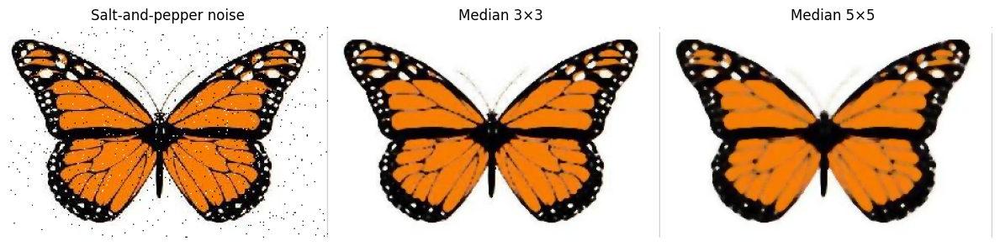

In [24]:
# Apply median filter to the salt-and-pepper image
m3 = cv2.medianBlur((sp), 3)
m5 = cv2.medianBlur((sp), 5)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(sp, vmin=0, vmax=1) 
axes[0].set_title("Salt-and-pepper noise")
axes[0].axis("off")
axes[1].imshow(m3, vmin=0, vmax=1)
axes[1].set_title("Median 3×3")
axes[1].axis("off")
axes[2].imshow(m5, vmin=0, vmax=1)
axes[2].set_title("Median 5×5")
axes[2].axis("off")
plt.tight_layout()
plt.show()


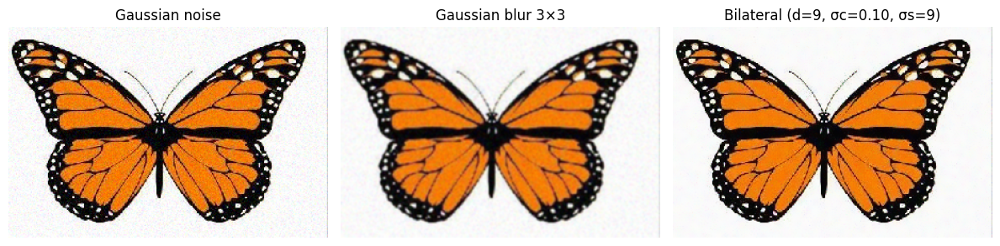

In [21]:
# Apply bilateral filter to the Gaussian-noisy image
bilat = cv2.bilateralFilter(gauss, d=9, sigmaColor=0.10, sigmaSpace=9)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(gauss, vmin=0, vmax=1); axes[0].set_title("Gaussian noise")
axes[0].axis("off")
axes[1].imshow(g3, vmin=0, vmax=1)
axes[1].set_title("Gaussian blur 3×3")
axes[1].axis("off")
axes[2].imshow(bilat, vmin=0, vmax=1)
axes[2].set_title("Bilateral (d=9, σc=0.10, σs=9)")
axes[2].axis("off")
plt.tight_layout()
plt.show()


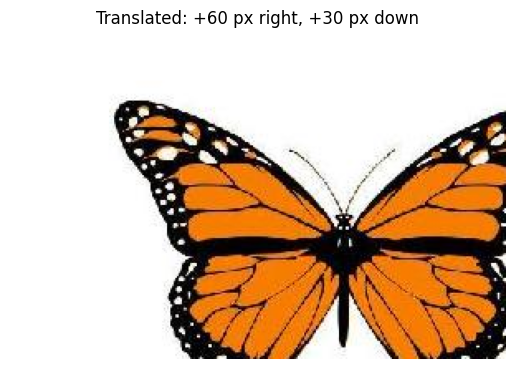

In [22]:
h, w = img_rgb.shape[:2]

# Move 60 px to the right and 30 px down
tx, ty = 60, 30

# Translation matrix (2×3). Think of the last column as "how much to move".
M = np.float32([[1, 0, tx],
                [0, 1, ty]])

shifted = cv2.warpAffine(
    img_rgb, M, dsize=(w, h),
    flags=cv2.INTER_LINEAR,                        
    borderMode=cv2.BORDER_CONSTANT, borderValue=(1.0, 1.0, 1.0)  # fill new areas with white
)

plt.imshow(shifted, vmin=0, vmax=1)
plt.title("Translated: +60 px right, +30 px down")
plt.axis("off")
plt.show()

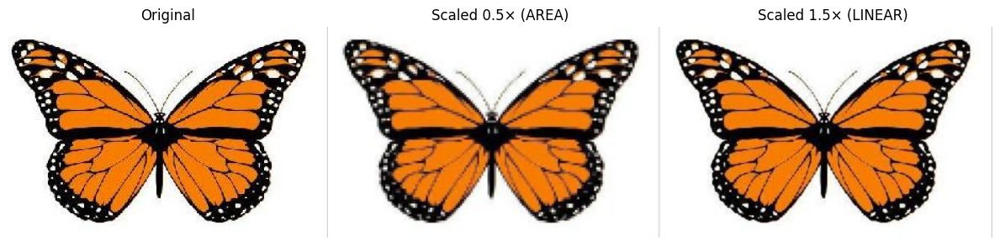

In [23]:
# Scaled versions
down = cv2.resize(img_rgb, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)   # shrink (AREA)
up   = cv2.resize(img_rgb, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_LINEAR) # enlarge (LINEAR)

# Original vs Scaled
fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(img_rgb, vmin=0, vmax=1)
axes[0].set_title("Original")
axes[0].axis("off")
axes[1].imshow(down,vmin=0, vmax=1)
axes[1].set_title("Scaled 0.5× (AREA)")
axes[1].axis("off")
axes[2].imshow(up, vmin=0, vmax=1)
axes[2].set_title("Scaled 1.5× (LINEAR)")
axes[2].axis("off")
plt.tight_layout()
plt.show()

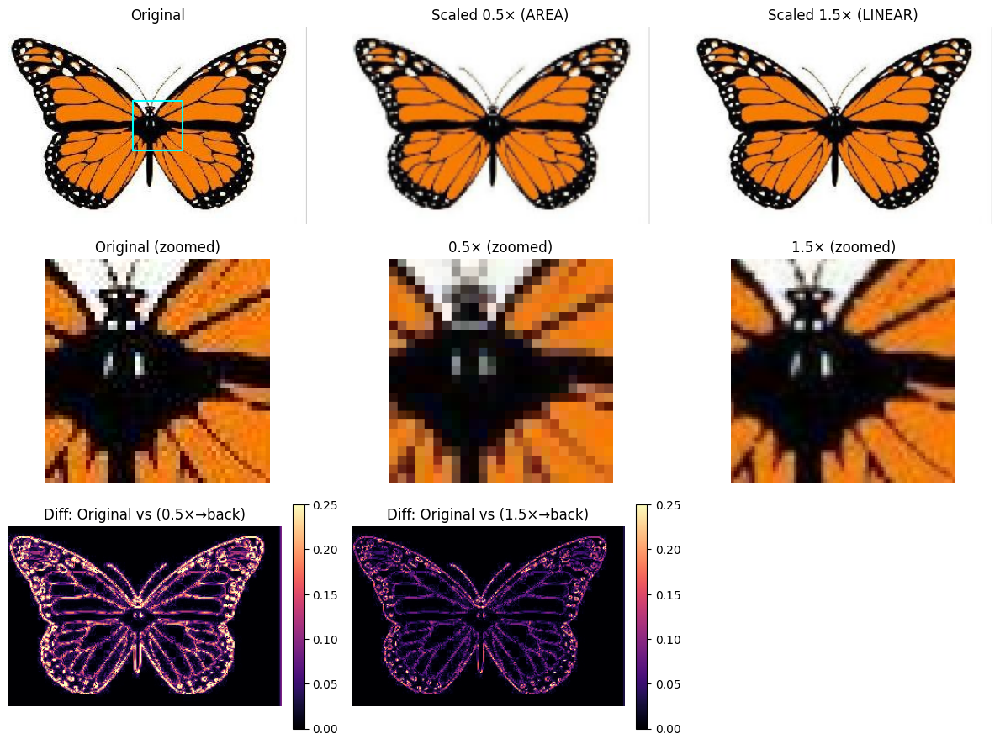

In [24]:
import matplotlib.patches as patches
# Make scaled versions
down = cv2.resize(img_rgb, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)   # shrink
up   = cv2.resize(img_rgb, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_LINEAR) # enlarge

# Bring them to the same size as the original for fair per-pixel comparisons
h, w = img_rgb.shape[:2]
down_up = cv2.resize(down, (w, h), interpolation=cv2.INTER_LINEAR)   # down → up to original size
up_down = cv2.resize(up,   (w, h), interpolation=cv2.INTER_AREA)     # up   → down to original size

# Difference maps (absolute difference, averaged over channels for display)
diff_downup = np.abs(img_rgb - down_up).mean(axis=2)   # shape (H, W)
diff_updown = np.abs(img_rgb - up_down).mean(axis=2)

# Define a small central patch to zoom (adjust size as you like)
ph, pw = 50, 50
cy, cx = h // 2, w // 2
y0, y1 = cy - ph//2, cy + ph//2
x0, x1 = cx - pw//2, cx + pw//2
patch_orig = img_rgb[y0:y1, x0:x1]
patch_down = cv2.resize(down[y0//2:y1//2, x0//2:x1//2], (pw, ph), interpolation=cv2.INTER_NEAREST)

# For 'up', the patch region coordinates scale by 1.5
uy0, uy1 = int(y0*1.5), int(y1*1.5)
ux0, ux1 = int(x0*1.5), int(x1*1.5)
patch_up = up[uy0:uy1, ux0:ux1]

# To visualize pixels, upscale patches with nearest-neighbor
zoom = 6
z_orig = cv2.resize(patch_orig, (pw*zoom, ph*zoom), interpolation=cv2.INTER_NEAREST)
z_down = cv2.resize(patch_down, (pw*zoom, ph*zoom), interpolation=cv2.INTER_NEAREST)
z_up   = cv2.resize(patch_up,   (pw*zoom, ph*zoom),   interpolation=cv2.INTER_NEAREST)

# Plot: originals and scaled; zoomed patches; difference maps
fig = plt.figure(figsize=(12, 9))

# Row 1: Original vs Scaled
ax = fig.add_subplot(3, 3, 1); ax.imshow(img_rgb, vmin=0, vmax=1); ax.set_title("Original"); ax.axis("off")
ax = fig.add_subplot(3, 3, 2); ax.imshow(down,    vmin=0, vmax=1); ax.set_title("Scaled 0.5× (AREA)"); ax.axis("off")
ax = fig.add_subplot(3, 3, 3); ax.imshow(up,      vmin=0, vmax=1); ax.set_title("Scaled 1.5× (LINEAR)"); ax.axis("off")

# Row 2: Zoomed central patches (pixel structure)
ax = fig.add_subplot(3, 3, 4); ax.imshow(z_orig, vmin=0, vmax=1); ax.set_title("Original (zoomed)"); ax.axis("off")
ax = fig.add_subplot(3, 3, 5); ax.imshow(z_down, vmin=0, vmax=1); ax.set_title("0.5× (zoomed)");    ax.axis("off")
ax = fig.add_subplot(3, 3, 6); ax.imshow(z_up,   vmin=0, vmax=1); ax.set_title("1.5× (zoomed)");    ax.axis("off")

# Row 3: Difference maps (per-pixel mean absolute difference)
ax = fig.add_subplot(3, 3, 7); im=ax.imshow(diff_downup, cmap="magma", vmin=0, vmax=0.25)
ax.set_title("Diff: Original vs (0.5×→back)"); ax.axis("off"); fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
ax = fig.add_subplot(3, 3, 8); im=ax.imshow(diff_updown, cmap="magma", vmin=0, vmax=0.25)
ax.set_title("Diff: Original vs (1.5×→back)"); ax.axis("off"); fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

# Draw a rectangle showing the zoom window on the original (row 1, col 1)
ax = fig.axes[0]

rect = patches.Rectangle((x0, y0), pw, ph, linewidth=1.5, edgecolor='cyan', facecolor='none')
ax.add_patch(rect)

plt.tight_layout()
plt.show()


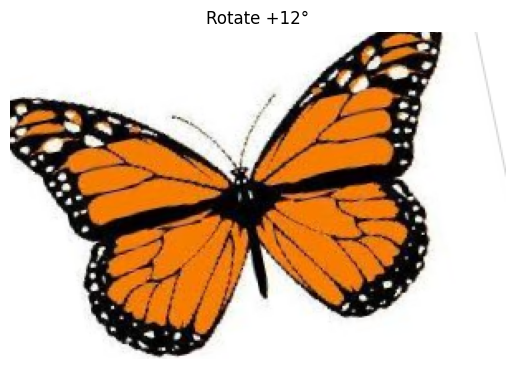

In [25]:
img = img_rgb
h, w = img.shape[:2]

angle = 12  # degrees (positive = counter-clockwise)
center = (w / 2, h / 2)

# Build a 2×3 rotation matrix about the chosen center
M = cv2.getRotationMatrix2D(center, angle, 1.0)  # scale=1.0 (no size change)

#Warp onto the original canvas; fill new areas with white
rot_fixed = cv2.warpAffine(
    img, M, dsize=(w, h),                      # (width, height)
    flags=cv2.INTER_LINEAR,                    # LINEAR for photos
    borderMode=cv2.BORDER_CONSTANT, borderValue=(1.0, 1.0, 1.0)
)

plt.imshow(rot_fixed, vmin=0, vmax=1)
plt.title("Rotate +12°")
plt.axis("off")
plt.show()

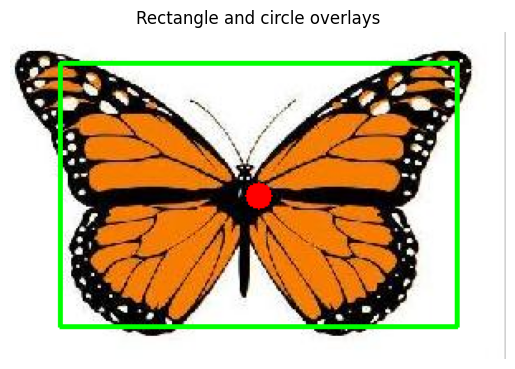

In [26]:
img_draw = img_bgr.copy()
h, w = img_draw.shape[:2]

# Example rectangle: roughly around the butterfly
x1, y1 = int(w * 0.10), int(h * 0.10)   # top-left corner
x2, y2 = int(w * 0.90), int(h * 0.90)   # bottom-right corner

# Draw a green rectangle (B, G, R) with thickness 2 pixels
cv2.rectangle(
    img_draw,
    pt1=(x1, y1),
    pt2=(x2, y2),
    color=(0, 255, 0),      # green in BGR
    thickness=2
)

# Example circle: mark the image centre
cx, cy = w // 2, h // 2
cv2.circle(
    img_draw,
    center=(cx, cy),
    radius=8,
    color=(0, 0, 255),      # red in BGR
    thickness=-1            # -1 means "filled circle"
)

img_draw_rgb = cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB)

plt.imshow(img_draw_rgb)
plt.title("Rectangle and circle overlays")
plt.axis("off")
plt.show()

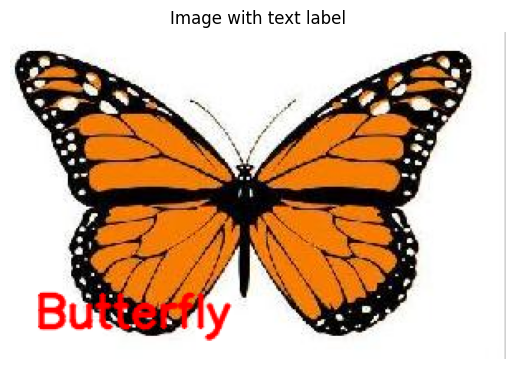

In [27]:

img_text = img_bgr.copy()
h, w = img_text.shape[:2]

label = "Butterfly"
org   = (int(w * 0.05), int(h * 0.90))  # bottom-left corner of the text

cv2.putText(
    img_text,
    text=label,
    org=org,
    fontFace=cv2.FONT_HERSHEY_SIMPLEX,
    fontScale=0.9,
    color=(0, 0, 255),  # red in BGR
    thickness=2,
    lineType=cv2.LINE_AA  # anti-aliased for smoother text
)

img_text_rgb = cv2.cvtColor(img_text, cv2.COLOR_BGR2RGB)
plt.imshow(img_text_rgb)
plt.title("Image with text label")
plt.axis("off")
plt.show()


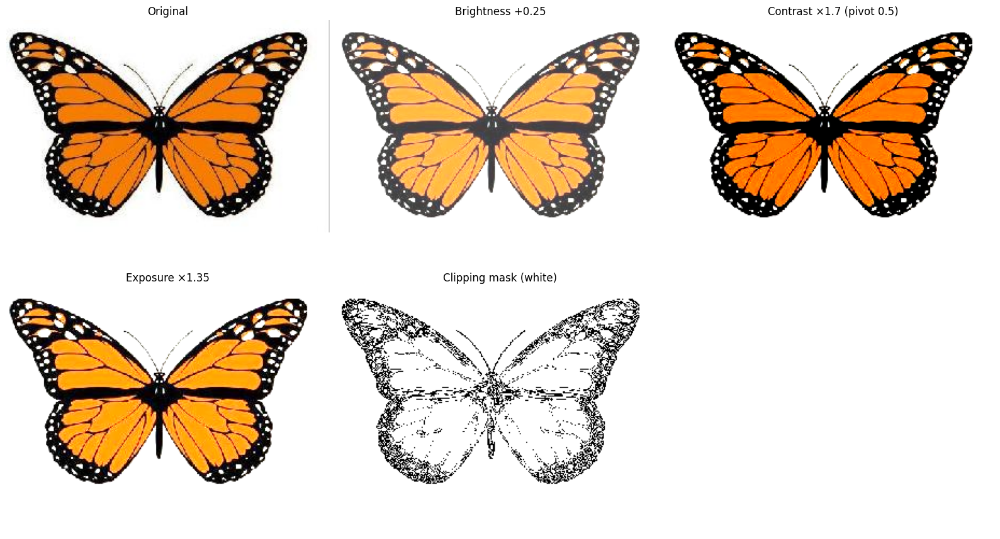

In [28]:
def adjust_brightness(img, beta=0.05):
    return np.clip(img + beta, 0.0, 1.0)

def adjust_contrast(img, alpha=1.30, pivot=0.5):
    out = (img - pivot) * alpha + pivot
    return np.clip(out, 0.0, 1.0)

def adjust_exposure(img, factor=1.30):
    return np.clip(img * factor, 0.0, 1.0)

beta = 0.25 # brightness offset 
alpha = 1.70 # contrast multiplier 
pivot = 0.50 # contrast pivot 
factor = 1.35 # exposure multiplier

img_bright   = adjust_brightness(img_rgb, beta=beta)
img_contrast = adjust_contrast(img_rgb, alpha=alpha, pivot=pivot)
img_exposed  = adjust_exposure(img_rgb, factor=factor)

# Clipping mask (white = clipped to 0 or 1 in any channel)
clip_mask = ((img_exposed <= 0.0) | (img_exposed >= 1.0)).any(axis=2).astype(np.float32)

fig, axes = plt.subplots(2, 3, figsize=(16, 9))

ax = axes[0, 0]
ax.imshow(img_rgb, vmin=0, vmax=1)
ax.set_title("Original")
ax.axis("off")

ax = axes[0, 1]
ax.imshow(img_bright, vmin=0, vmax=1)
ax.set_title(f"Brightness +{beta}")
ax.axis("off")

ax = axes[0, 2]
ax.imshow(img_contrast, vmin=0, vmax=1)
ax.set_title(f"Contrast ×{alpha} (pivot {pivot})")
ax.axis("off")

ax = axes[1, 0]
ax.imshow(img_exposed, vmin=0, vmax=1)
ax.set_title(f"Exposure ×{factor}")
ax.axis("off")

ax = axes[1, 1]
ax.imshow(clip_mask, cmap="gray", vmin=0, vmax=1)
ax.set_title("Clipping mask (white)")
ax.axis("off")

# empty cell (optional)
axes[1, 2].axis("off")

plt.tight_layout()
plt.show()


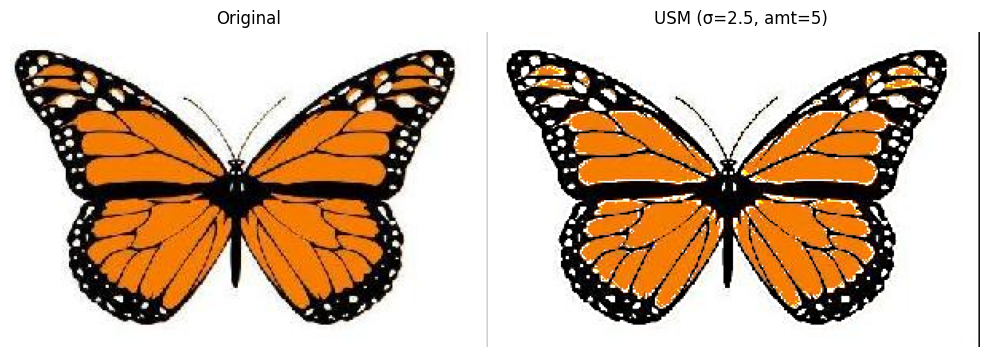

In [29]:
# Parameters
sigma   = 2.5   # blur radius (in pixels)
amount  = 5   # strength of sharpening
thresh  = 0.15  # ignore tiny differences (in [0,1])

# Blur the image
blur = cv2.GaussianBlur(img_rgb, ksize=(0, 0), sigmaX=sigma, sigmaY=sigma)

# Detail layer
detail = img_rgb - blur

# Optional threshold mask (apply only where detail is big enough)
mask = (np.abs(detail).mean(axis=2) > thresh).astype(np.float32)[..., None]

# Add a fraction of detail back
usm_rgb = np.clip(img_rgb + amount * detail * mask, 0.0, 1.0)

fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].imshow(img_rgb,  vmin=0, vmax=1)
ax[0].set_title("Original")
ax[0].axis("off")
ax[1].imshow(usm_rgb, vmin=0, vmax=1)
ax[1].set_title(f"USM (σ={sigma}, amt={amount})")
ax[1].axis("off")
plt.tight_layout()
plt.show()


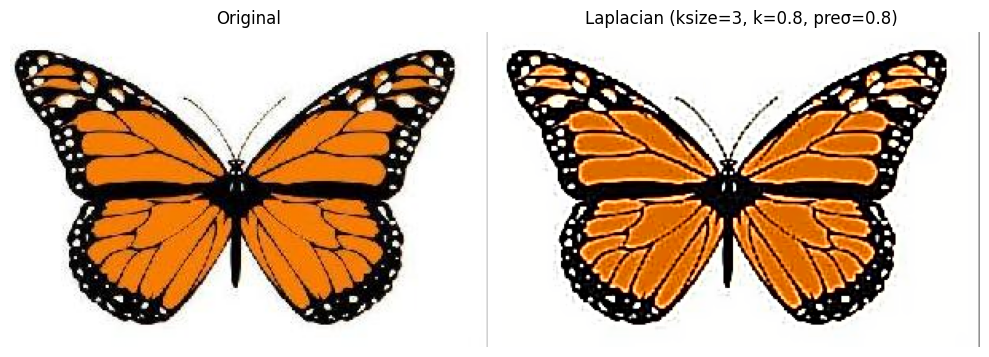

In [30]:
# Parameters
ksize = 3      # Laplacian kernel size 
k     = 0.8    # sharpening strength
preσ  = 0.8    # optional pre-blur sigma
thresh= 0.02   # ignore weak responses (in [0,1])

# Optional pre-blur (reduce noise sensitivity)
gray   = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
gray_s = cv2.GaussianBlur(gray, (0, 0), sigmaX=preσ, sigmaY=preσ)

# Laplacian edge map
lap = cv2.Laplacian(gray_s, cv2.CV_32F, ksize=ksize)

# Optional threshold mask
mask = (np.abs(lap) > thresh).astype(np.float32)

lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2Lab)
L   = (lab[..., 0] / 100.0).astype(np.float32)
L_sharp = np.clip(gray_s - k * lap * mask, 0.0, 1.0)
lab[..., 0] = (L_sharp * 100.0).astype(np.float32)
lap_rgb = np.clip(cv2.cvtColor(lab, cv2.COLOR_Lab2RGB), 0.0, 1.0)

fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].imshow(img_rgb, vmin=0, vmax=1)
ax[0].set_title("Original")
ax[0].axis("off")
ax[1].imshow(lap_rgb, vmin=0, vmax=1)
ax[1].set_title(f"Laplacian (ksize={ksize}, k={k}, preσ={preσ})")
ax[1].axis("off")
plt.tight_layout()
plt.show()


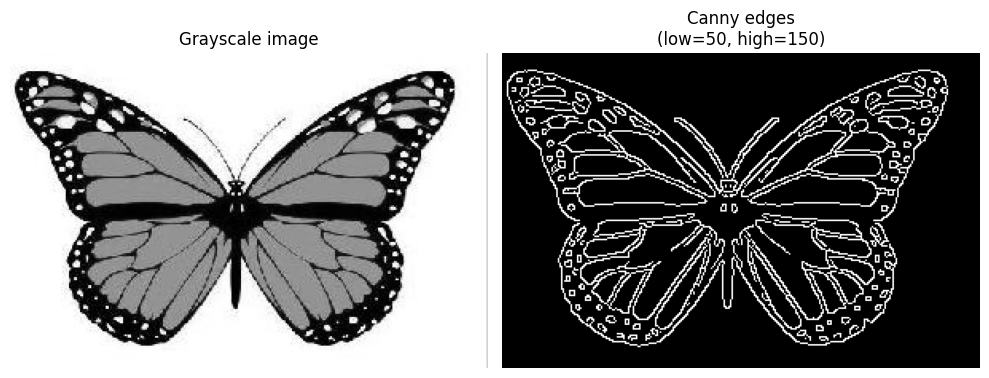

In [31]:
# Start from RGB float32 [0,1]
h, w = img_rgb.shape[:2]

# Convert to grayscale
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# Convert to uint8 [0,255] for OpenCV's Canny
gray_u8 = np.clip(img_gray * 255.0, 0, 255).astype(np.uint8)

# Optional light blur to reduce noise before edge detection
gray_blur = cv2.GaussianBlur(gray_u8, ksize=(5, 5), sigmaX=1.0, sigmaY=1.0)

# Canny edge detection
low_thresh  = 50   # lower hysteresis threshold
high_thresh = 150  # upper hysteresis threshold

edges = cv2.Canny(
    gray_blur,
    threshold1=low_thresh,
    threshold2=high_thresh,
    L2gradient=True
)

# Visualize: original grayscale and edge map
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

axes[0].imshow(img_gray, cmap="gray", vmin=0, vmax=1)
axes[0].set_title("Grayscale image")
axes[0].axis("off")

axes[1].imshow(edges, cmap="gray", vmin=0, vmax=255)
axes[1].set_title(f"Canny edges\n(low={low_thresh}, high={high_thresh})")
axes[1].axis("off")

plt.tight_layout()
plt.show()


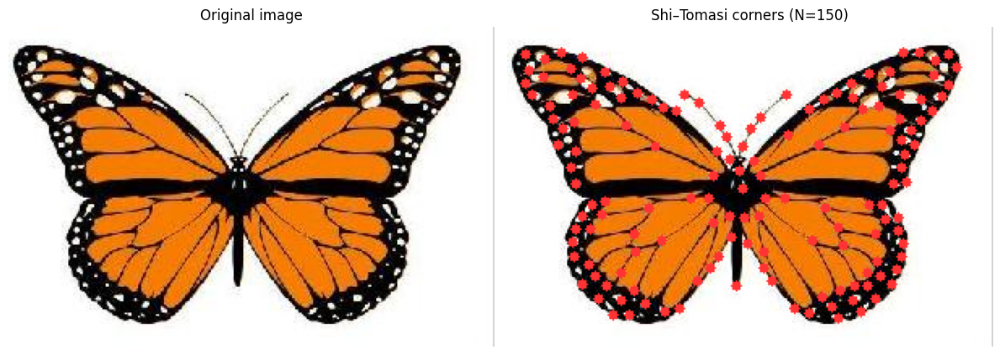

In [32]:
# Convert to grayscale float [0,1]
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

# Convert to uint8 [0,255]
gray_u8 = np.clip(img_gray * 255.0, 0, 255).astype(np.uint8)

# 3Detect corners
max_corners   = 150    # maximum number of corners to return
quality_level = 0.01   # minimum quality (fraction of best score)
min_distance  = 8      # minimum distance (in pixels) between returned corners

corners = cv2.goodFeaturesToTrack(
    gray_u8,
    maxCorners=max_corners,
    qualityLevel=quality_level,
    minDistance=min_distance,
    useHarrisDetector=False
)

if corners is None:
    corners = np.empty((0, 1, 2), dtype=np.float32)

# Draw small circles at corner locations on a copy of the RGB image
img_marked = img_rgb.copy()
for c in corners:
    x, y = c.ravel()   # c has shape (1,2); ravel() gives (x,y)
    cv2.circle(
        img_marked,
        center=(int(x), int(y)),
        radius=3,
        color=(1.0, 0.2, 0.2), 
        thickness=-1            
    )

# Show original and corners overlay
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_rgb, vmin=0, vmax=1)
axes[0].set_title("Original image")
axes[0].axis("off")

axes[1].imshow(img_marked, vmin=0, vmax=1)
axes[1].set_title(f"Shi–Tomasi corners (N={len(corners)})")
axes[1].axis("off")

plt.tight_layout()
plt.show()


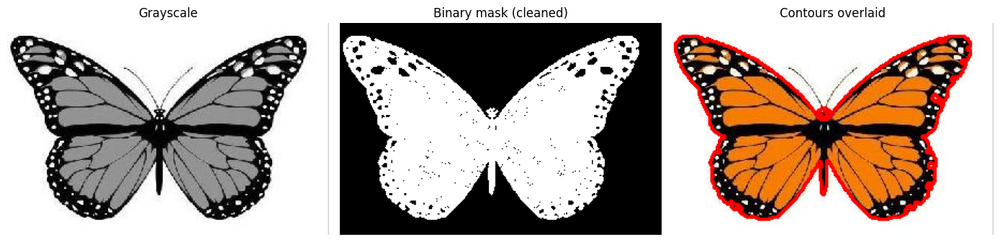

In [33]:
# Start from RGB float32 [0,1]
img = img_rgb.copy()

# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Scale to uint8 [0,255] for OpenCV threshold
gray_u8 = np.clip(gray * 255.0, 0, 255).astype(np.uint8)

# Otsu's threshold to get a binary mask (foreground vs background)
#    We invert here (THRESH_BINARY_INV) so darker objects become white,
#    but you can choose the variant that suits your image.
_, mask = cv2.threshold(
    gray_u8, 0, 255,
    cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)

# Optional: small morphological opening to remove tiny specks
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
mask_clean = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)

# Find contours on the cleaned mask
contours, hierarchy = cv2.findContours(
    mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
)

# Draw contours on a copy of the original image
img_contours = img.copy()
cv2.drawContours(
    img_contours,
    contours,
    contourIdx=-1,                 
    color=(1.0, 0.0, 0.0),          
    thickness=2
)

fig, axes = plt.subplots(1, 3, figsize=(14, 4))
axes[0].imshow(gray, cmap="gray", vmin=0, vmax=1)
axes[0].set_title("Grayscale")
axes[0].axis("off")

axes[1].imshow(mask_clean, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Binary mask (cleaned)")
axes[1].axis("off")

axes[2].imshow(img_contours, vmin=0, vmax=1)
axes[2].set_title("Contours overlaid")
axes[2].axis("off")

plt.tight_layout()

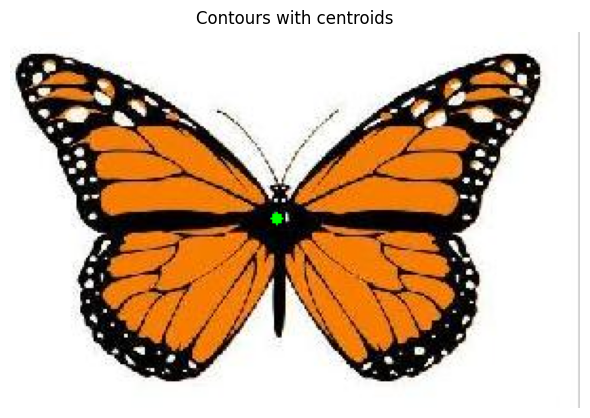

Measured 1 contours with area ≥ 200


,index,area,perimeter,centroid_x,centroid_y,circularity
0,0,27804.0,1234.16059,140.359577,98.185069,0.22939


In [34]:
import pandas as pd

min_area = 200  # ignore very small blobs (tune to your data)

stats = []
img_measured = img_rgb.copy()

for idx, cnt in enumerate(contours):
    area = cv2.contourArea(cnt)
    if area < min_area:
        continue  # skip tiny contours

    perimeter = cv2.arcLength(cnt, closed=True)

    # Spatial moments for centroid computation
    M = cv2.moments(cnt)
    if M["m00"] != 0:
        cx = M["m10"] / M["m00"]
        cy = M["m01"] / M["m00"]
    else:
        cx, cy = np.nan, np.nan

    # Simple circularity metric (guard against division by zero)
    if perimeter > 0:
        circularity = 4.0 * np.pi * (area / (perimeter ** 2))
    else:
        circularity = np.nan

    stats.append({
        "index": idx,
        "area": area,
        "perimeter": perimeter,
        "centroid_x": cx,
        "centroid_y": cy,
        "circularity": circularity,
    })

    # Draw centroid for visual check
    if not np.isnan(cx) and not np.isnan(cy):
        cv2.circle(
            img_measured,
            center=(int(cx), int(cy)),
            radius=3,
            color=(0.0, 1.0, 0.0),   # green
            thickness=-1
        )

fig, ax = plt.subplots(1, 1, figsize=(6, 5))
ax.imshow(img_measured, vmin=0, vmax=1)
ax.set_title("Contours with centroids")
ax.axis("off")
plt.tight_layout()
plt.show()

print(f"Measured {len(stats)} contours with area ≥ {min_area}")
df_stats = pd.DataFrame(stats)
df_stats


In [35]:
# path = "group.jpg" 

# img_bgr = cv2.imread(path)
# if img_bgr is None:
#     raise FileNotFoundError(f"Could not read image at {path}")

# gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

# cascade_path = cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
# face_cascade = cv2.CascadeClassifier(cascade_path)

# faces = face_cascade.detectMultiScale(
#     gray,
#     scaleFactor=1.1,
#     minNeighbors=5,
#     minSize=(40, 40)
# )

# img_draw = img_bgr.copy()
# for (x, y, w, h) in faces:
#     cv2.rectangle(img_draw, (x, y), (x + w, y + h), (0, 255, 0), 2)

# img_rgb = cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB)

# plt.imshow(img_rgb)
# plt.title(f"Detected faces: {len(faces)}")
# plt.axis("off")
# plt.show()

In [36]:
# # One orange pixel in RGB (float32 in [0, 1])
# rgb_pixel = np.array([[[1.0, 0.5, 0.0]]], dtype=np.float32)

# hsv_pixel = cv2.cvtColor(rgb_pixel, cv2.COLOR_RGB2HSV)
# lab_pixel = cv2.cvtColor(rgb_pixel, cv2.COLOR_RGB2Lab)

# H, S, V = hsv_pixel[0, 0]
# L, a, b = lab_pixel[0, 0]

# fig, axes = plt.subplots(1, 4, figsize=(14, 4), constrained_layout=True)

# # Panel 1: RGB patch
# ax1 = axes[0]
# patch = np.ones((80, 80, 3), dtype=np.float32) * rgb_pixel[0, 0]
# ax1.imshow(patch, vmin=0, vmax=1)
# ax1.set_title("RGB patch")
# ax1.axis("off")
# ax1.text(
#     0.02, 0.02, f"RGB={rgb_pixel[0,0]}",
#     transform=ax1.transAxes, ha="left", va="bottom",
#     bbox=dict(facecolor="white", alpha=0.8, edgecolor="none")
# )

# # Panel 2: Hue strip + marker
# ax2 = axes[1]
# h_vals = np.linspace(0.0, 360.0, 361, dtype=np.float32)
# hsv_strip = np.stack([h_vals, np.ones_like(h_vals), np.ones_like(h_vals)], axis=1).reshape(1, -1, 3)
# rgb_strip = cv2.cvtColor(hsv_strip, cv2.COLOR_HSV2RGB)

# ax2.imshow(rgb_strip, aspect="auto", extent=[0, 360, 0, 1], vmin=0, vmax=1)
# ax2.axvline(H, linewidth=2)
# ax2.set_xlim(0, 360)
# ax2.set_yticks([])
# ax2.set_xticks([0, 60, 120, 180, 240, 300, 360])
# ax2.set_title("HSV Hue (0–360°)")
# ax2.text(
#     0.02, 0.02, f"H≈{H:.1f}°",
#     transform=ax2.transAxes, ha="left", va="bottom",
#     bbox=dict(facecolor="white", alpha=0.8, edgecolor="none")
# )

# # Panel 3: S and V bars
# ax3 = axes[2]
# bar_h, bar_w = 30, 140
# S_bar = np.ones((bar_h, bar_w), dtype=np.float32) * S
# V_bar = np.ones((bar_h, bar_w), dtype=np.float32) * V
# gap = np.zeros((12, bar_w), dtype=np.float32)
# stack = np.vstack([S_bar, gap, V_bar])

# ax3.imshow(stack, cmap="gray", vmin=0, vmax=1)
# ax3.set_title("HSV S and V")
# ax3.axis("off")
# ax3.text(0.02, 0.74, "S", transform=ax3.transAxes, ha="left", va="center")
# ax3.text(0.02, 0.22, "V", transform=ax3.transAxes, ha="left", va="center")
# ax3.text(
#     0.02, 0.02, f"S={S:.2f}, V={V:.2f}",
#     transform=ax3.transAxes, ha="left", va="bottom",
#     bbox=dict(facecolor="white", alpha=0.8, edgecolor="none")
# )

# # Panel 4: Lab a–b plane + point
# ax4 = axes[3]
# ax4.scatter([a], [b], s=80)
# ax4.axhline(0, linewidth=1)
# ax4.axvline(0, linewidth=1)
# ax4.set_xlim(-128, 128)
# ax4.set_ylim(-128, 128)
# ax4.set_aspect("equal", adjustable="box")
# ax4.set_title("Lab a–b plane")
# ax4.set_xlabel("a (green ↔ red)")
# ax4.set_ylabel("b (blue ↔ yellow)")
# ax4.text(
#     0.02, 0.02, f"L={L:.1f}, a={a:.1f}, b={b:.1f}",
#     transform=ax4.transAxes, ha="left", va="bottom",
#     bbox=dict(facecolor="white", alpha=0.8, edgecolor="none")
# )

# plt.show()


In [38]:
import os
import urllib.request

def download_if_missing(url, filepath):
    os.makedirs(os.path.dirname(filepath), exist_ok=True)
    if not os.path.exists(filepath):
        print(f"Downloading: {url}")
        urllib.request.urlretrieve(url, filepath)
        print(f"Saved to: {filepath}")
    else:
        print(f"Already exists: {filepath}")

model_dir = "models/opencv_face"
prototxt_path = os.path.join(model_dir, "deploy.prototxt")
caffemodel_path = os.path.join(model_dir, "res10_300x300_ssd_iter_140000.caffemodel")

download_if_missing(
    "https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/deploy.prototxt",
    prototxt_path
)

download_if_missing(
    "https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel",
    caffemodel_path
)


Already exists: models/opencv_face\deploy.prototxt
Downloading: https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel
Saved to: models/opencv_face\res10_300x300_ssd_iter_140000.caffemodel


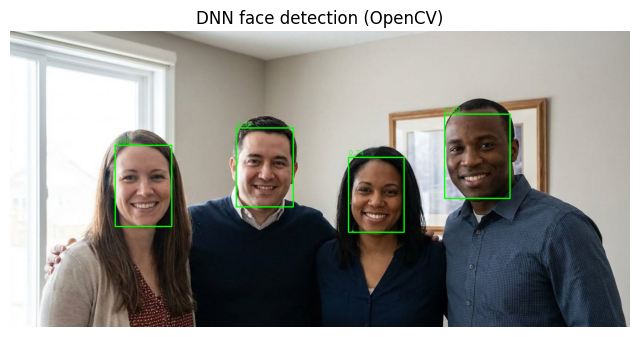

In [39]:
path = "group.jpg" 

img_bgr = cv2.imread(path)
if img_bgr is None:
    raise FileNotFoundError(f"Could not read image at {path}")

net = cv2.dnn.readNetFromCaffe(prototxt_path, caffemodel_path)

h, w = img_bgr.shape[:2]

blob = cv2.dnn.blobFromImage(
    img_bgr,
    scalefactor=1.0,
    size=(300, 300),
    mean=(104.0, 177.0, 123.0),
    swapRB=False,
    crop=False
)

net.setInput(blob)
detections = net.forward()

img_draw = img_bgr.copy()
conf_thresh = 0.60

for i in range(detections.shape[2]):
    conf = float(detections[0, 0, i, 2])
    if conf < conf_thresh:
        continue

    x1, y1, x2, y2 = (detections[0, 0, i, 3:7] * np.array([w, h, w, h])).astype(int)

    cv2.rectangle(img_draw, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(
        img_draw, f"{conf:.2f}",
        (x1, max(0, y1 - 5)),
        cv2.FONT_HERSHEY_SIMPLEX, 0.5,
        (0, 255, 0), 1
    )

img_rgb = cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8, 6))
plt.imshow(img_rgb)
plt.title("DNN face detection (OpenCV)")
plt.axis("off")
plt.show()


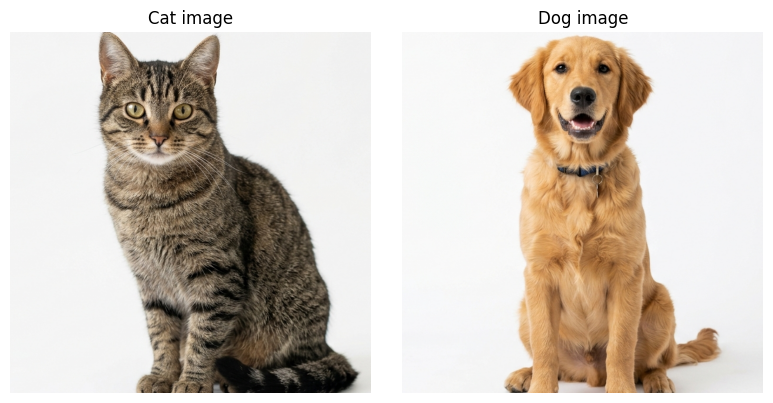

In [35]:
cat_bgr = cv2.imread("cat_image.png")
dog_bgr = cv2.imread("dog_image.png")

cat_rgb = cv2.cvtColor(cat_bgr, cv2.COLOR_BGR2RGB)
dog_rgb = cv2.cvtColor(dog_bgr, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(8, 4))

axes[0].imshow(cat_rgb)
axes[0].set_title("Cat image")
axes[0].axis("off")

axes[1].imshow(dog_rgb)
axes[1].set_title("Dog image")
axes[1].axis("off")

plt.tight_layout()
plt.show()

In [38]:
def summarize_image(img_rgb):
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, 100, 200)

    summary = {
        "shape": img_rgb.shape,
        "mean_rgb": img_rgb.mean(axis=(0, 1)),
        "std_rgb": img_rgb.std(axis=(0, 1)),
        "gray_mean": gray.mean(),
        "gray_std": gray.std(),
        "edge_density": (edges > 0).mean()
    }
    return summary, gray

def gray_histogram(gray, bins=8):
    hist = cv2.calcHist([gray], [0], None, [bins], [0, 256]).flatten()
    hist = hist / hist.sum()
    return hist

cat_summary, cat_gray = summarize_image(cat_rgb)
dog_summary, dog_gray = summarize_image(dog_rgb)

cat_hist = gray_histogram(cat_gray)
dog_hist = gray_histogram(dog_gray)

print("Cat image summary")
for k, v in cat_summary.items():
    print(f"{k}: {v}")

print("\nDog image summary")
for k, v in dog_summary.items():
    print(f"{k}: {v}")

print("\nCat histogram:", cat_hist)
print("Dog histogram:", dog_hist)

Cat image summary
shape: (614, 614, 3)
mean_rgb: [181.07880985 175.57425012 168.37647349]
std_rgb: [78.88076265 83.38272228 89.54244424]
gray_mean: 176.40873112712072
gray_std: 82.63997302031808
edge_density: 0.11425320162548144

Dog image summary
shape: (614, 614, 3)
mean_rgb: [223.23700517 207.12058218 191.67313446]
std_rgb: [40.32812181 57.27221383 76.25647118]
gray_mean: 210.13285817356152
gray_std: 53.59550721615194
edge_density: 0.023830491570202336

Cat histogram: [0.05448334 0.08775955 0.11023989 0.07819977 0.05625524 0.03787839
 0.01896837 0.55621547]
Dog histogram: [0.00386742 0.01058367 0.02770321 0.06128182 0.10612049 0.09711244
 0.05841176 0.6349192 ]
